In [2]:
import numpy as np
import scipy
import robust_mean_estimate as rl
import importlib as il
from scipy import special
from numpy import linalg as LA
import matplotlib.pyplot as plt
%matplotlib inline
import mpld3
mpld3.enable_notebook()

fsize = 20
fpad = 10
figsize = (8,4)
fontname = 'fantasy'

In [3]:
"loss, time vs dimension -- Levy -- dense biased -- set data"

il.reload(rl)

trials = 50

m, k, eps = 500, 4, 0.05
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps)

inputfilename = 'data/loss-time-vs-dimension-Levy.pkl'
plot_d = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_d.setdata_tofile(filename = inputfilename, xvar_name = 'd', trials = trials, xs = xs)

[[  10.65357099   -4.26530137   -1.13267927 ... -200.6928977
     3.92089693   -0.62888647]
 [   6.38277811  -61.54945307   -8.71748151 ...   -1.75803038
     1.13296177 -267.38168037]
 [  34.17193969  -38.05827385   -3.39550701 ...    2.1241871
     3.60183778    0.3696873 ]
 ...
 [   8.96865691   -6.17839712   -2.8738405  ...  -84.56905293
    -5.52553387    2.01286564]
 [   7.40960493   -8.18572604    5.98288554 ...   -1.5517956
    -3.52887327    4.50419682]
 [   7.70992201   13.05809651   -4.32374164 ...    2.62778863
   -74.53943711   -0.75169098]]
ATTENTION
[[-18.158508539500247],[-8.241057279072994],[-34.42310694686405],[-6.671407918524148]]
[48  2  1  0]
[ 9.70890754e+00 -5.80850262e+00 -2.24976153e-01  9.41451155e-03
  3.01675195e-06  8.06563523e-05  3.96258008e-04 -3.01675195e-06
  8.06563523e-05 -1.63198578e-05 -1.94159532e-03 -3.63352618e-05
  7.23924787e-06 -3.96258008e-04  3.01675195e-06  3.01675195e-06
  8.06563523e-05 -8.06563523e-05 -1.63198578e-05  3.63352618e-05
 -8

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:380: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:398: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")


[[-1.40326058e+01 -6.93412769e+00 -7.59448194e-01 ... -1.25837800e+00
   7.32864658e-01  9.97163379e-01]
 [ 9.70927931e+00 -2.06622298e+00 -5.54514407e+00 ... -5.38013568e-01
   1.15322640e+03 -7.19248445e-01]
 [ 3.67884407e+02 -3.29293721e+00 -1.60678129e+03 ...  2.32560733e+00
  -2.60402779e-01 -3.09581695e+00]
 ...
 [ 2.99493562e+01 -7.54217754e+00 -9.60667273e+00 ... -9.87210142e+00
  -1.38447946e+00  1.69161382e+00]
 [ 5.75891083e+00 -7.43529359e+00 -6.09085500e+00 ...  1.00594195e+01
  -1.61136514e+00 -7.88671813e-01]
 [ 6.17250950e+00 -5.81966433e+00 -3.35911966e+00 ... -1.33361566e+02
  -1.45506961e+01 -1.00344920e+01]]
ATTENTION
[[-29.580921991105857],[14.02662324190737],[-0.7930866343373806],[32.93824086160973]]
[24  2  1  0]
[ 9.58865262e+00 -5.02030144e+00 -2.37767513e+00  9.48946746e-03
 -1.63198578e-05 -3.01675195e-06 -1.63198578e-05 -1.78840842e-04
  3.63352618e-05  1.78840842e-04  3.01675195e-06 -3.96258008e-04
 -3.01675195e-06 -3.63352618e-05 -3.63352618e-05 -1.7884084

AttributeError: 'XAxis' object has no attribute '_gridOnMajor'

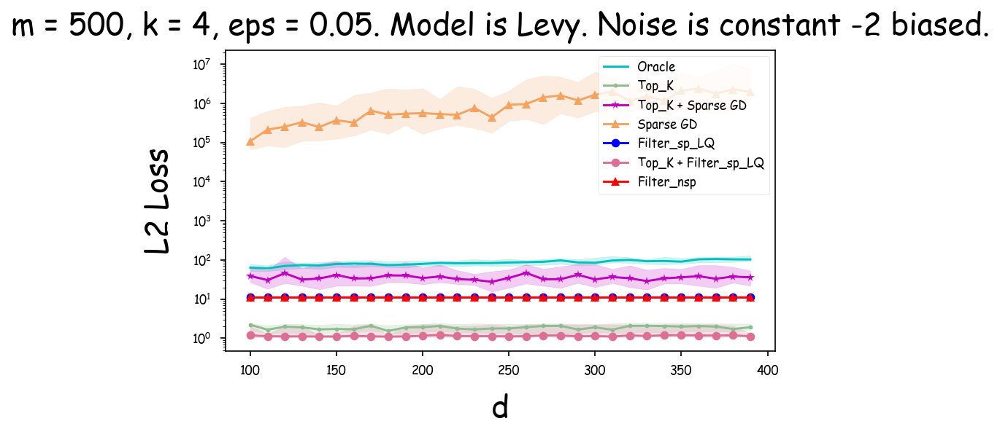

<Figure size 1200x600 with 0 Axes>

In [5]:
"loss vs dimension -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

m, k, eps = 500, 4, 0.05
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-dimension-Levy.pkl'
outputfilename = 'figs/loss-vs-dimension-Levy.pdf'

title = 'm = {m}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'L2 Loss'

plot_d_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_loss.plotxy_fromfile(yscale = 'log', outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

AttributeError: 'XAxis' object has no attribute '_gridOnMajor'

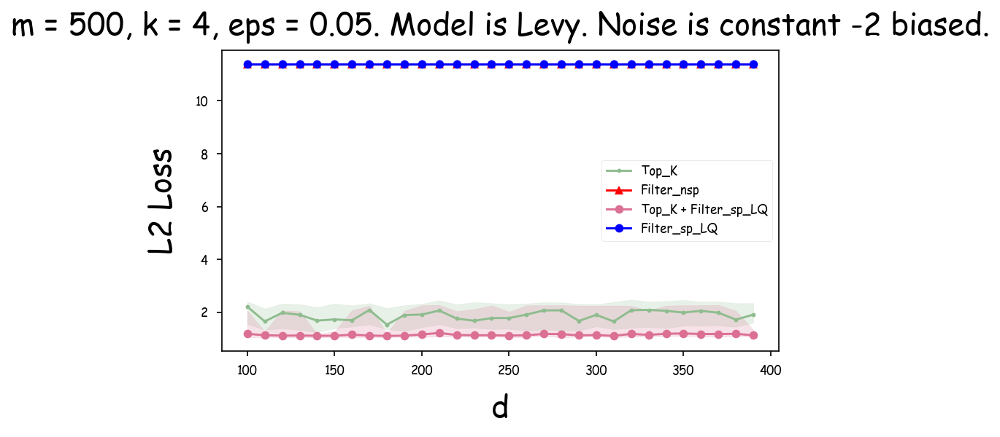

<Figure size 1200x600 with 0 Axes>

In [7]:
"loss vs dimension -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, k, eps = 500, 4, 0.05
xs = list(np.arange(100, 400, 10))

keys = [rl.Top_K, rl.RME, rl.Top_K_Filtered, rl.RME_sp]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-dimension-Levy.pkl'
outputfilename = 'figs/loss-vs-dimension-Levy-detailed.pdf'

title = 'm = {m}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'L2 Loss'

plot_d_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs dimension -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

m, k, eps = 500, 4, 0.05
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps)

outputfilename = 'figs/time-vs-dimension-Levy.pdf'
inputfilename = 'data/loss-time-vs-dimension-Levy.pkl'
title = 'm = {m}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'Time'

plot_d_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs dimension -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, k, eps = 500, 4, 0.05
xs = list(np.arange(100, 400, 10))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, k = k, eps = eps)

outputfilename = 'figs/time-vs-dimension-Levy-detailed.pdf'
inputfilename = 'data/loss-time-vs-dimension-Levy.pkl'
title = 'm = {m}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, k = k, eps = eps)
xlabel = 'd'
ylabel = 'Time'

plot_d_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_d_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [8]:
"loss, time vs sparsity -- Levy -- dense biased -- set data"

il.reload(rl)

trials = 50

m, d, eps = 200, 100, 0.05
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps)

inputfilename = 'data/loss-time-vs-sparsity-Levy.pkl'
plot_k = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_k.setdata_tofile(filename = inputfilename, xvar_name = 'k', trials = trials, xs = xs)

[[-2.83707188e-01 -5.28622058e-01 -2.08135505e+01 ...  3.59975783e+01
  -5.47402852e-01  2.18054318e+00]
 [ 3.03570129e+02  2.34836051e+00  1.26211424e+00 ...  1.33616105e+01
   1.65424783e+01 -1.09661117e+03]
 [-8.12302007e-01 -2.13080617e+03  5.12097725e-01 ... -3.49905254e+00
   5.77677846e-01  1.07909702e+00]
 ...
 [-1.72614658e+00 -1.58668217e-01 -1.51181327e+00 ... -2.76167628e+00
  -1.36971241e+00 -2.57553938e+01]
 [ 4.82603520e+00 -2.50705632e-01 -8.92536226e+00 ... -5.33636912e+00
  -2.10183564e+01 -3.17545120e+00]
 [-2.63855571e+00  1.20179048e+00  3.32993689e+00 ... -3.00650181e+00
  -2.52336808e+00  1.57415570e+00]]
ATTENTION
[[-0.37067170728108056],[15.783066440841326],[-4.806410823083682],[16.20767151746821]]
[ 3 32 88  4]
[ 5.41460901e-05  1.51534843e-01 -3.96258008e-04  1.16975019e+00
  2.56037107e+00  2.09591556e-02 -5.41460901e-05  7.23924787e-06
  0.00000000e+00  7.23924787e-06  0.00000000e+00  7.23924787e-06
  7.23924787e-06  0.00000000e+00 -3.96258008e-04 -5.414609

/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:380: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")
/Users/chenruidemac/Documents/GitHub/Robust_mean_estimation/robust_mean_estimate.py:398: RuntimeWarning: invalid value encountered in double_scalars
  f"Filtered out {l - len(idx[0])}/{l}, {bad_filtered} false ({bad_filtered / (l - len(idx[0])):0.2f} vs {self.fdr})")


[[ 5.42136518e-01  1.52740721e+00  7.85235710e-01 ... -3.16924540e+00
  -1.08567617e+01  7.85057116e-01]
 [ 4.92282818e-01  3.44302235e+00  6.10640299e-01 ... -7.88577652e-01
   8.99239013e-01 -7.98919172e+01]
 [ 5.69447008e-01  8.72426771e+00  1.41089799e+00 ...  1.94820019e+00
  -4.81661297e-01  3.86705968e+02]
 ...
 [-3.28704063e+00 -1.38141713e+00 -9.56552463e+00 ... -4.86951314e+00
  -2.87097133e+00 -3.06076391e+00]
 [-9.39438919e+00  1.85158293e+00 -3.87141743e+00 ... -5.24618372e+01
  -1.59360718e+00 -1.60521914e+00]
 [-1.20047105e-02 -3.40604680e-01 -7.01699346e-01 ... -6.16034106e+00
  -2.36784850e+00  6.55753146e+04]]
ATTENTION
[[556.5276052293877],[154.49464396227938],[337.5542665166039],[0.12409089943538731],[-551.1370964057758],[-153.5134407994651],[32.623271447246765],[-455.7777051364375]]
[31  2 99 17 57  4 26 22]
[ 3.96258008e-04  2.09591556e-02  1.05730696e+00  3.96258008e-04
 -1.93916217e+00 -7.23924787e-06  0.00000000e+00  3.96258008e-04
 -3.96258008e-04  0.00000000e

AttributeError: 'XAxis' object has no attribute '_gridOnMajor'

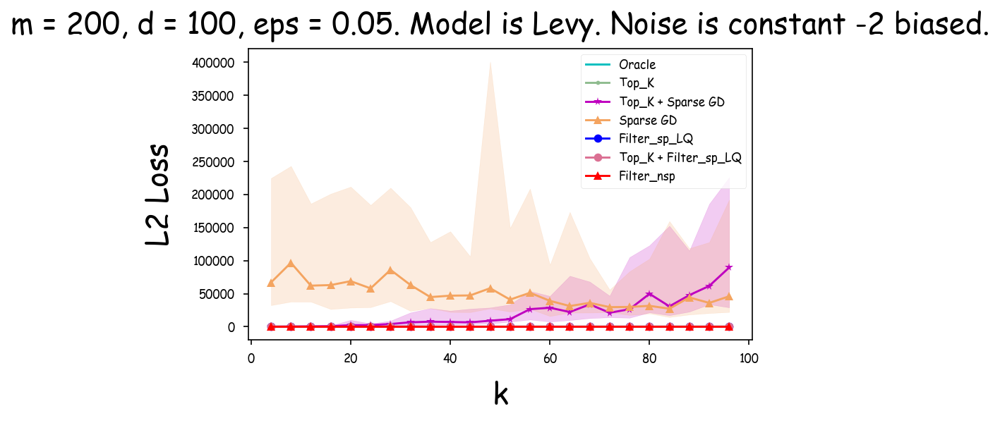

<Figure size 1200x600 with 0 Axes>

In [9]:
"loss vs sparsity -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

m, d, eps = 200, 100, 0.05
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps)
inputfilename = 'data/loss-time-vs-sparsity-Levy.pkl'
outputfilename = 'figs/loss-vs-sparsity-Levy.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'L2 Loss'

plot_k_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_loss.plotxy_fromfile(yscale = 'log', outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss vs sparsity -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, d, eps = 200, 100, 0.05
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps)
inputfilename = 'data/loss-time-vs-sparsity-Levy.pkl'
outputfilename = 'figs/loss-vs-sparsity-Levy-detailed.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'L2 Loss'

plot_k_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sparsity -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

m, d, eps = 200, 100, 0.05
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps)
inputfilename = 'data/loss-time-vs-sparsity-Levy.pkl'
outputfilename = 'figs/time-vs-sparsity-Levy.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'Time'

plot_k_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sparsity -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

m, d, eps = 200, 100, 0.05
xs = list(np.arange(4, 100, 4))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(m = m, d = d, eps = eps)
inputfilename = 'data/loss-time-vs-sparsity-Levy.pkl'
outputfilename = 'figs/time-vs-sparsity-Levy-detailed.pdf'

title = 'm = {m}, d = {d}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(m = m, d = d, eps = eps)
xlabel = 'k'
ylabel = 'Time'

plot_k_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_k_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss, time vs sample -- Levy -- dense biased -- set data"

il.reload(rl)

trials = 50

d, k, eps = 100, 4, 0.05
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps)

inputfilename = 'data/loss-time-vs-sample-Levy.pkl'
plot_m = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_m.setdata_tofile(filename = inputfilename, xvar_name = 'd', trials = trials, xs = xs)

In [ ]:
"loss vs sample -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, eps = 100, 4, 0.05
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-sample-Levy.pkl'
outputfilename = 'figs/loss-vs-sample-Levy.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'L2 Loss'

plot_m_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss vs sample -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, eps = 100, 4, 0.05
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-sample-Levy.pkl'
outputfilename = 'figs/loss-vs-sample-Levy-detailed.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'L2 Loss'

plot_m_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sample -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, eps = 100, 4, 0.05
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-sample-Levy.pkl'
outputfilename = 'figs/time-vs-sample-Levy.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'Time'

plot_m_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs sample -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, eps = 100, 4, 0.05
xs = list(np.arange(100, 1000, 50))

keys = [rl.Oracle, rl.RME_sp, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, eps = eps)
inputfilename = 'data/loss-time-vs-sample-Levy.pkl'
outputfilename = 'figs/time-vs-sample-Levy-detailed.pdf'

title = 'd = {d}, k = {k}, eps = {eps}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, eps = eps)
xlabel = 'm'
ylabel = 'Time'

plot_m_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_m_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss, time vs eps -- Levy -- dense biased -- set data"

il.reload(rl)

trials = 50

d, k, m = 100, 4, 3000
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.GaussianNoise()
model_params = rl.Params(d = d, k = k, m = m)

inputfilename = 'data/loss-time-vs-eps-Levy.pkl'
plot_m = rl.load_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)
plot_m.setdata_tofile(filename = inputfilename, xvar_name = 'eps', trials = trials, xs = xs)

In [ ]:
"loss vs eps -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, m = 100, 4, 3000
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.GaussianNoise()
model_params = rl.Params(d = d, k = k, m = m)
inputfilename = 'data/loss-time-vs-eps-Levy.pkl'
outputfilename = 'figs/loss-vs-eps-Levy.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is Levy. Noise is Gaussian.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"loss vs eps -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, m = 100, 4, 3000
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.Top_K_Filtered]

model = rl.LevyModel()
noise_model = rl.GaussianNoise()
model_params = rl.Params(d = d, k = k, m = m)
inputfilename = 'data/loss-time-vs-eps-Levy.pkl'
outputfilename = 'figs/loss-vs-eps-Levy-detailed.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is Levy. Noise is Gaussian.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'L2 Loss'

plot_eps_loss = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_loss.plotxy_fromfile(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs eps -- Levy -- dense biased -- plot"

il.reload(rl)

trials = 50

d, k, m = 100, 4, 3000
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m)
inputfilename = 'data/loss-time-vs-eps-Levy.pkl'
outputfilename = 'figs/time-vs-eps-Levy.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'Time'

plot_eps_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)

In [ ]:
"time vs eps -- Levy -- dense biased -- plot -- detailed"

il.reload(rl)

trials = 50

d, k, m = 100, 4, 3000
xs = list(np.arange(0.01, 0.11, 0.01))

keys = [rl.Oracle, rl.Top_K, rl.Topk_GD, rl.GDAlgs, rl.RME_sp, rl.Top_K_Filtered, rl.RME]

model = rl.LevyModel()
noise_model = rl.DenseNoise(-2)
model_params = rl.Params(d = d, k = k, m = m)
inputfilename = 'data/loss-time-vs-eps-Levy.pkl'
outputfilename = 'figs/time-vs-eps-Levy-detailed.pdf'

title = 'd = {d}, k = {k}, m = {m}. Model is Levy. Noise is constant -2 biased.'.format(d = d, k = k, m = m)
xlabel = 'eps'
ylabel = 'Time'

plot_eps_time = rl.plot_data(model = model, noise_model = noise_model, params = model_params, loss = rl.err, keys = keys)

plot_eps_time.plotxy_fromfile_time(outputfilename = outputfilename, filename = inputfilename, title = title, xlabel = xlabel, ylabel = ylabel, figsize = figsize, fsize = fsize, fpad = fpad, xs = xs, fontname = fontname)